# TSP with SA
## AmirAli Amini
### 610399102

# Implementation

### First, we import the necessary libraries.


In [34]:
import random
import numpy as np
import math
import matplotlib.pyplot as plt

In [35]:
class SA:
    def __init__(self,initialTemp = 500,TL = 300000,alpha = 0.9999 , expectedAns = 2800 , ignoreTL = False):
        self.temp = initialTemp
        self.TL = TL
        self.expectedAns = expectedAns
        self.ignoreTL = ignoreTL
        self.alpha = alpha
        self.x = []
        self.y = []


        

    def inputFile(self , path , greedyPath=True):
        lines = open(path, 'r').readlines()
        assert 'NODE_COORD_SECTION\n' in lines
        index = lines.index('NODE_COORD_SECTION\n')
        data = lines[index + 1:-1]
        tmp = []
        for line in data:
            line = line.strip().split(' ')
            if line[0] == 'EOF':
                continue
            tmpline = []
            for x in line:
                if x == '':
                    continue
                else:
                    tmpline.append(float(x))
            if tmpline == []:
                continue
            tmp.append(tmpline)
        data = tmp
        data = np.array(data)
        data = data[:, 1:]

        self.intializer(data)
        


    def intializer(self , coordinates):
        self.citySize = len(coordinates)
        self.coordinates = coordinates
        self.distanceMatrix = [[math.sqrt((self.coordinates[i][0] - self.coordinates[j][0])**2 + (self.coordinates[i][1] - self.coordinates[j][1])**2) for i in range(len(coordinates))]for j in range (len(coordinates))]
        self.solution = list(random.sample(range(self.citySize), self.citySize))

        self.solution = list(random.sample(range(self.citySize), self.citySize))
        self.fitness = self.fitnessFunction(self.solution)


    def fitnessFunction(self, path):
        fitness_value = 0
        for i in range(self.citySize):
            fitness_value += self.distanceMatrix[path[i % self.citySize]][path[(i+1)%self.citySize]]
        return fitness_value  


    def CreateNeighbor(self,path):
        swapped_path = path.copy()
        city_1,city_2 = random.sample(range(self.citySize),2)
        swapped_path[city_1], swapped_path[city_2] = swapped_path[city_2], swapped_path[city_1]
        return swapped_path

    def nextIteration(self):
        neighbor = self.CreateNeighbor(self.solution)
        delta = self.fitnessFunction(neighbor) - self.fitnessFunction(self.solution)
        if delta < 0:
            self.solution = neighbor
            self.fitness = self.fitnessFunction(self.solution)
        else:
            randomQ = random.random()
            if randomQ < math.exp(-1*delta/self.temp):
                self.solution = neighbor
                self.fitness = self.fitnessFunction(self.solution)

    def SARunner(self):
        i = 0
        while (self.fitness > self.expectedAns):
            self.x.append(i)
            self.y.append(self.fitness)
            i +=1
            if (not self.ignoreTL and i > self.TL):
                break

            self.nextIteration()
            print(f'in itration  {i} and temp of {self.temp} :  best answer is : {self.fitness}')
            self.temp = self.alpha*self.temp


    def printBest(self):
         print(f'the best answer in temp of {self.temp}  : {self.fitness}')


    def printPlot(self):
        plt.plot(self.x, self.y)
        plt.xlabel("ith generation")
        plt.ylabel("min distance")
        plt.show()




## ----------------------------------gr229----------------------------------------

In [36]:
gr229 = SA()
gr229.inputFile('gr229.tsp')
gr229.SARunner()

in itration  1 and temp of 500 :  best answer is : 15737.351757085942
in itration  2 and temp of 499.95 :  best answer is : 15771.722505596706
in itration  3 and temp of 499.900005 :  best answer is : 15746.231815670095
in itration  4 and temp of 499.85001499950005 :  best answer is : 15745.657035275299
in itration  5 and temp of 499.8000299980001 :  best answer is : 15744.066925572903
in itration  6 and temp of 499.7500499950003 :  best answer is : 15808.395247400267
in itration  7 and temp of 499.7000749900008 :  best answer is : 15808.897721289599
in itration  8 and temp of 499.65010498250183 :  best answer is : 15782.056831234235
in itration  9 and temp of 499.6001399720036 :  best answer is : 15752.345483105104
in itration  10 and temp of 499.5501799580064 :  best answer is : 15764.230507873279
in itration  11 and temp of 499.50022494001064 :  best answer is : 15771.320872754326
in itration  12 and temp of 499.45027491751665 :  best answer is : 15824.272246492172
in itration  13 a

In [38]:
gr229.printBest()

the best answer in temp of 0.010244321851886826  : 2799.748965550309


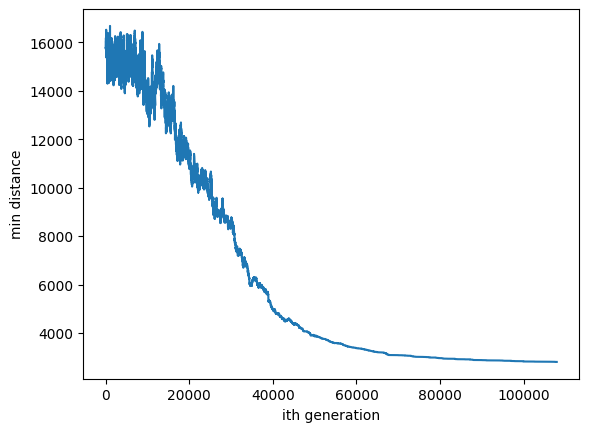

In [39]:
gr229.printPlot()

## ----------------------------------pr1002----------------------------------------

In [ ]:
pr1002 = SA()
pr1002.inputFile('pr1002.tsp')
pr1002.SARunner()